#**TASK - 1**

In [1]:
#Clone the YOLOv5 repository and install the dependencies
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 16748, done.
remote: Counting objects: 100% (69/69), done.
remote: Compressing objects: 100% (54/54), done.
remote: Total 16748 (delta 26), reused 46 (delta 15), pack-reused 16679
Receiving objects: 100% (16748/16748), 15.36 MiB | 14.88 MiB/s, done.
Resolving deltas: 100% (11505/11505), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 21.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 799.6/799.6 kB 15.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 38.8 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the followin

In [2]:
from google.colab import files
import zipfile
import os
import shutil

In [3]:
# Upload data.yaml
uploaded = files.upload()
data_yaml_filename = list(uploaded.keys())[0]
shutil.move(data_yaml_filename, 'data.yaml')

Saving data.yaml to data.yaml


'data.yaml'

In [4]:
# Upload zipped dataset
uploaded = files.upload()
zip_filename = list(uploaded.keys())[0]

Saving Human Detection.v2i.zip to Human Detection.v2i.zip


In [5]:
# Unzip the dataset
with zipfile.ZipFile(zip_filename, 'r') as zip_ref:
    zip_ref.extractall('/content/dataset')

In [6]:
# Verify the dataset structure
print("Train images:", os.listdir('/content/dataset/train/images')[:5])
print("Train labels:", os.listdir('/content/dataset/train/labels')[:5])
print("Valid images:", os.listdir('/content/dataset/valid/images')[:5])
print("Valid labels:", os.listdir('/content/dataset/valid/labels')[:5])
print("Test images:", os.listdir('/content/dataset/test/images')[:5])
print("Test labels:", os.listdir('/content/dataset/test/labels')[:5])

Train images: ['IMG_2021_JPG.rf.62ae8bbedd7c5075df419bd956a18ab7.jpg', 'IMG_1716_JPG.rf.72238d773f10f3177e69aca056c694a3.jpg', 'IMG_1831_JPG.rf.5a83772c06d485628e836ec80b011faa.jpg', 'IMG_1909_JPG.rf.9daf36536179b7382a6c4ed577353f34.jpg', 'IMG_1726_JPG.rf.584f47b3692242b47cecbf13cb87ea33.jpg']
Train labels: ['IMG_1815_JPG.rf.4818fb89fec47f2e86881ce533be393e.txt', 'IMG_1924_JPG.rf.b849f899ccd7a31757e48ab298a9aba0.txt', 'IMG_1809_JPG.rf.ff195e6d6bde6d8e0a263f253783f840.txt', 'IMG_1874_JPG.rf.f2f8da587a0d6776b7e72d1a4ae4cda9.txt', 'IMG_1743_JPG.rf.f8e538697658d57d237e4ee3a07fc7c6.txt']
Valid images: ['IMG_1778_JPG.rf.004e30353bd0da8a50b080bdc9f7f381.jpg', 'IMG_2025_JPG.rf.0641385353e95cf9167a248fdc852b55.jpg', 'IMG_1839_JPG.rf.c99c11db509e7418e854e01454fe8a11.jpg', 'IMG_1964_JPG.rf.7beeb4e7f40457de0e4c84f55c968f48.jpg', 'IMG_2018_JPG.rf.512c202eac5f7496bae8363d856f6504.jpg']
Valid labels: ['IMG_2015_JPG.rf.865f64d4d93d48f79db72ac0ee8faf6c.txt', 'IMG_1871_JPG.rf.41fc4e980e56fb8d34953cc9045

In [7]:
# Verify the data.yaml file (for verification purposes)
# Open and print the content of data.yaml to ensure paths and settings are correct
with open('data.yaml', 'r') as file:
    data_yaml = file.read()
    print(data_yaml)

train: ../train/images
val: ../valid/images

nc: 1
names: ['Person']


In [8]:
# Ensure the data.yaml paths are correct
with open('data.yaml', 'w') as file:
    file.write(f"""
train: /content/dataset/train/images
val: /content/dataset/valid/images
test: /content/dataset/test/images

nc: 1  # number of classes
names: ['person']  # class names
""")

In [9]:
#Train the YOLOv5 model
# Set the parameters for training

IMG_SIZE = 689  # Size of input images
BATCH_SIZE = 16  # Number of images per batch
EPOCHS = 5  # Number of epochs

In [10]:
# Train the model
!python train.py --img {IMG_SIZE} --batch {BATCH_SIZE} --epochs {EPOCHS} --data data.yaml --weights yolov5s.pt

2024-07-09 15:22:55.628143: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-09 15:22:55.628228: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-09 15:22:55.631018: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=5, batch_size=16, imgsz=689, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimi

In [11]:
!python val.py --data data.yaml --weights runs/train/exp/weights/best.pt

val: data=data.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-338-gff063284 Python-3.10.12 torch-2.3.0+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/dataset/valid/labels.cache... 66 images, 0 backgrounds, 0 corrupt: 100% 66/66 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 3/3 [00:30<00:00, 10.26s/it]
                   all         66        146      0.917      0.932      0.949      0.467
Speed: 5.1ms pre-process, 453.3ms inference, 0.8ms NMS per image at shape (32, 3, 640, 640)
Results saved to runs/val/exp


In [18]:
if os.path.exists(results_file):
    results = pd.read_csv(results_file)
    print(results.columns)

Index(['               epoch', '      train/box_loss', '      train/obj_loss',
       '      train/cls_loss', '   metrics/precision', '      metrics/recall',
       '     metrics/mAP_0.5', 'metrics/mAP_0.5:0.95', '        val/box_loss',
       '        val/obj_loss', '        val/cls_loss', '               x/lr0',
       '               x/lr1', '               x/lr2'],
      dtype='object')


In [21]:
import pandas as pd

# Read the metrics from results.txt
results_file = 'runs/train/exp/results.csv'

if os.path.exists(results_file):
    results = pd.read_csv(results_file)
    precision = results['   metrics/precision'].iloc[-1]
    recall = results['      metrics/recall'].iloc[-1]
    map50 = results['     metrics/mAP_0.5'].iloc[-1]
    map = results['metrics/mAP_0.5:0.95'].iloc[-1]

    print(f'Precision: {precision}')
    print(f'Recall: {recall}')
    print(f'mAP@0.5: {map50}')
    print(f'mAP@0.5:0.95: {map}')
else:
    print("results.csv file not found. Unable to extract metrics.")

Precision: 0.92643
Recall: 0.94882
mAP@0.5: 0.96003
mAP@0.5:0.95: 0.51367


In [22]:
# Test the model on new images
# The test images should be in the unzipped dataset directory
TEST_IMAGE_PATH = '/content/dataset/test/images'

In [23]:
!python detect.py --source {TEST_IMAGE_PATH} --weights runs/train/exp/weights/best.pt --img {IMG_SIZE} --conf 0.25

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/dataset/test/images, data=data/coco128.yaml, imgsz=[689, 689], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-338-gff063284 Python-3.10.12 torch-2.3.0+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ --img-size [689, 689] must be multiple of max stride 32, updating to [704, 704]
image 1/35 /content/dataset/test/images/IMG_1721_JPG.rf.4850a0d4ced7315fdc2a8ea7e2b49625.jpg: 704x704 1 person, 389.0ms
image 2/35 /content/dataset/test/images/IMG_1732_JPG.rf.4716c181f77ae8296de0b0d5ab1d65ec.jpg: 704x704 2 persons, 327.5ms
image 3/35 /

In [24]:
# Display results
import cv2
from google.colab.patches import cv2_imshow
import glob

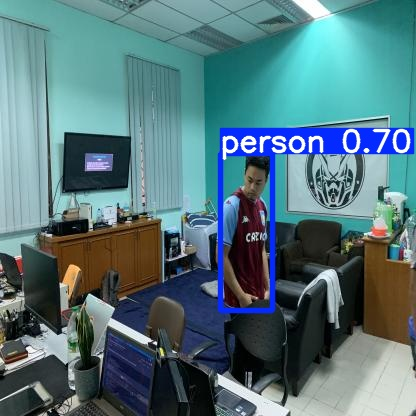

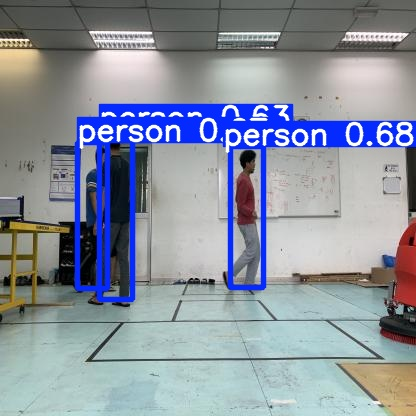

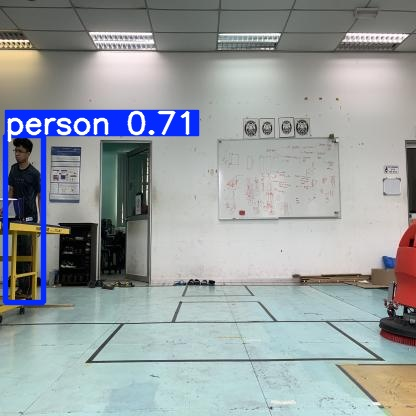

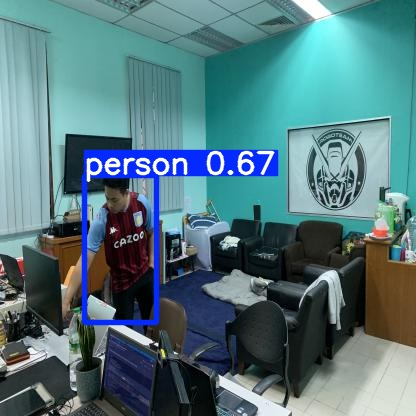

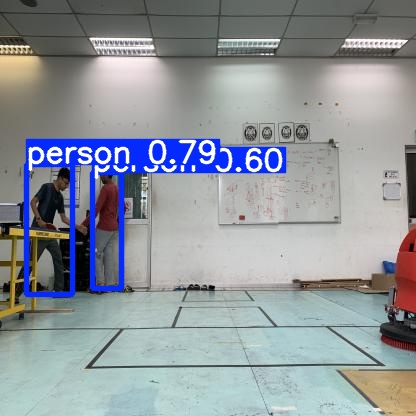

...

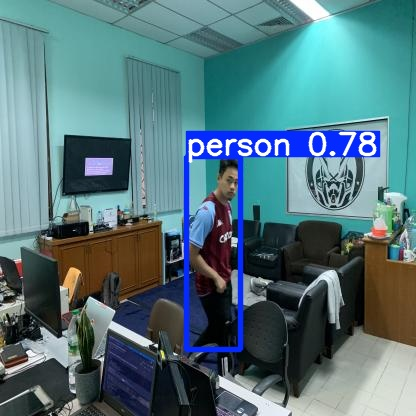

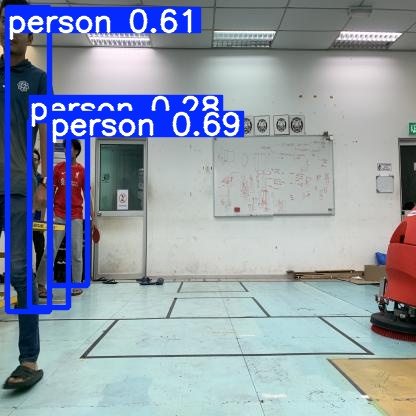

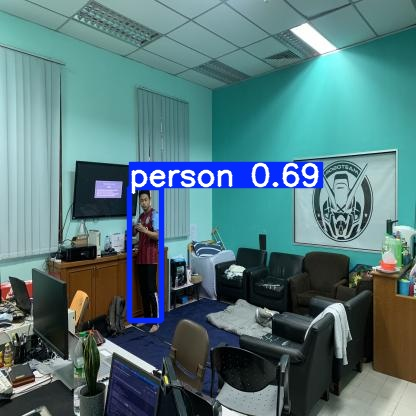

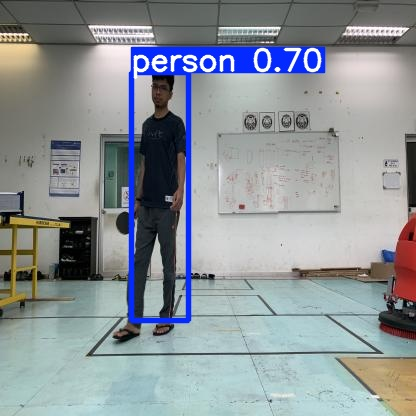

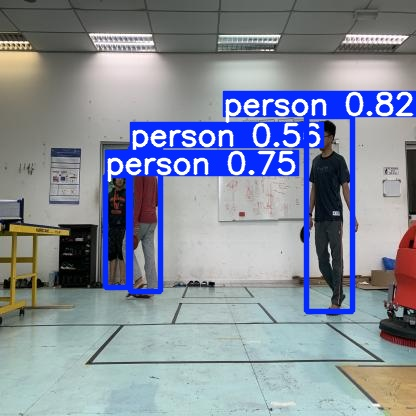

In [25]:
# Load and display example test images with detections
output_images = glob.glob('runs/detect/exp/*')
for image_path in output_images:
    image = cv2.imread(image_path)
    cv2_imshow(image)